In [1]:
import pandas as pd
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from glob import glob 
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from skimage.util import random_noise
import imutils
import os

## Carga dos dados e limitação da imagem

In [2]:
images_path = glob("./landscapes/*")[:1000]#1000]
images = []
height = 256
width = 256
for image_path in images_path:
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    
    rows, cols = image.shape[:2]
    aspect_ratio = cols/rows
    if aspect_ratio > 1:
        if cols > width:
            image = imutils.resize(image, width=width)
    elif rows > height:
        image = imutils.resize(image, height=height)
    images.append(image)

## Aplicação de ruidos

In [3]:
noisy_images = [np.array(255*random_noise(image, mode='s&p',amount=0.2), dtype='uint8') for image in images]

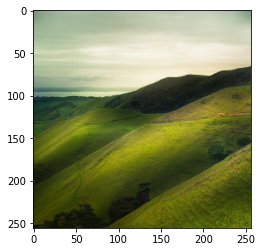

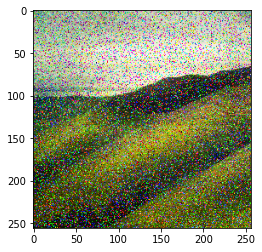

In [4]:
plt.imshow(images[0])
plt.show()
plt.imshow(noisy_images[0])
plt.show()

## Insserção de borda pra deixar a imagem quadrada

In [5]:
for i in range(len(images)):
    new_image = np.zeros((height, width, 3), dtype='uint8')
    new_image[:images[i].shape[0], :images[i].shape[1], :] = images[i]
    images[i] = new_image
    new_image = np.zeros((height, width, 3), dtype='uint8')
    new_image[:noisy_images[i].shape[0], :noisy_images[i].shape[1], :] = noisy_images[i]
    noisy_images[i] = new_image

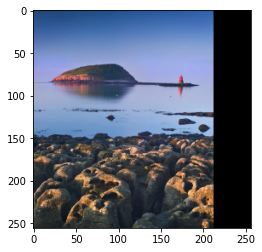

In [6]:
plt.imshow(images[100])
plt.show()

## Normalização

In [7]:
images = np.array(images)/255
noisy_images = np.array(noisy_images)/255

## Divisão do dado em treino, teste e validação

In [8]:
x_train, x_val, y_train, y_val = train_test_split(noisy_images, images, train_size=0.95, shuffle=True)
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, train_size=0.9, shuffle=True)

del noisy_images
del images

## Modelo U-Net

In [45]:
def build_model(input_layer, start_neurons):
    conv1 = Conv2D(start_neurons*1,(3,3), activation='relu', padding='same')(input_layer)
    conv1 = Conv2D(start_neurons*1,(3,3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D((2,2))(conv1)
    pool1 = Dropout(0.25)(pool1)
    
    conv2 = Conv2D(start_neurons*2,(3,3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(start_neurons*2,(3,3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D((2,2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4,(3,3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(start_neurons*4,(3,3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D((2,2))(conv3)
    pool3 = Dropout(0.5)(pool3)
    
    conv4 = Conv2D(start_neurons*8,(3,3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(start_neurons*8,(3,3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D((2,2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    #Middle
    convm = Conv2D(start_neurons * 16, (3,3), activation='relu', padding='same')(pool4)
    convm = Conv2D(start_neurons * 16, (3,3), activation='relu', padding='same')(convm)
    
    #upconv part
    deconv4 = Conv2DTranspose(start_neurons*8,(3,3), strides=(2,2), padding='same')(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, (3,3), activation='relu', padding='same')(uconv4)
    uconv4 = Conv2D(start_neurons*8, (3,3), activation='relu', padding='same')(uconv4)
    
    deconv3 = Conv2DTranspose(start_neurons*8,(3,3), strides=(2,2), padding='same')(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, (3,3), activation='relu', padding='same')(uconv3)
    uconv3 = Conv2D(start_neurons*4, (3,3), activation='relu', padding='same')(uconv3)
    
    deconv2 = Conv2DTranspose(start_neurons*8,(3,3), strides=(2,2), padding='same')(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, (3,3), activation='relu', padding='same')(uconv2)
    uconv2 = Conv2D(start_neurons*2, (3,3), activation='relu', padding='same')(uconv2)
    
    deconv1 = Conv2DTranspose(start_neurons*8,(3,3), strides=(2,2), padding='same')(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons*1, (3,3), activation='relu', padding='same')(uconv1)
    uconv1 = Conv2D(start_neurons*1, (3,3), activation='relu', padding='same')(uconv1)
    
    output_layer = Conv2D(3, (1,1), padding='same', activation='sigmoid')(uconv1)
    return output_layer

img_size_target = 256
input_layer = Input((256, 256,3))
output_layer = build_model(input_layer,64)

model = Model(input_layer, output_layer)
opt = Adam(learning_rate=0.0001)
model.compile(loss='mse', optimizer=opt)
model.summary()

Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_89 (Conv2D)              (None, 256, 256, 64) 1792        input_14[0][0]                   
__________________________________________________________________________________________________
conv2d_90 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_89[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_38 (MaxPooling2D) (None, 128, 128, 64) 0           conv2d_90[0][0]                  
___________________________________________________________________________________________

## Modelo FER2013 Denoising

In [56]:
input_img = Input(shape=(None, None, 3))

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Dropout(0.2)(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)


# at this point the representation is (7, 7, 32)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Dropout(0.2)(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
decoded = Conv2D(3, (3, 3), activation='relu', padding='same')(decoded)

model = Model(input_img, decoded)
opt = Adam(learning_rate=0.0001)
model.compile(loss='mse', optimizer=opt)
model.summary()

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
conv2d_108 (Conv2D)          (None, None, None, 32)    896       
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
dropout_40 (Dropout)         (None, None, None, 32)    0         
_________________________________________________________________
conv2d_109 (Conv2D)          (None, None, None, 32)    9248      
_________________________________________________________________
max_pooling2d_43 (MaxPooling (None, None, None, 32)    0         
_________________________________________________________________
conv2d_110 (Conv2D)          (None, None, None, 32)    924

## Execução do modelo

In [57]:
epochs=200

callbacks = [tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1, min_delta=1e-4, mode='min')]
callbacks.append(tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, verbose=0, restore_best_weights=True))

history = model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=epochs, callbacks=callbacks, batch_size=4)

Epoch 1/200
214/214 [==============================] - 4s 15ms/step - loss: 0.0283 - val_loss: 0.0199
Epoch 2/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0084 - val_loss: 0.0175
Epoch 3/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0070 - val_loss: 0.0151
Epoch 4/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0063 - val_loss: 0.0148
Epoch 5/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0058 - val_loss: 0.0143
Epoch 6/200
214/214 [==============================] - 3s 14ms/step - loss: 0.0055 - val_loss: 0.0136
Epoch 7/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0052 - val_loss: 0.0133
Epoch 8/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0050 - val_loss: 0.0127
Epoch 9/200
214/214 [==============================] - 3s 13ms/step - loss: 0.0048 - val_loss: 0.0128
Epoch 10/200
214/214 [==============================] - 3s 14ms/step - loss: 0.004

In [58]:
model.save('./model')#_unet

INFO:tensorflow:Assets written to: ./model\assets


In [61]:
model = tf.keras.models.load_model('./model_unet')

## Validação
### Score U-Net: 0.005145975388586521
### Score FER2013 Denoising: 0.0050713540986180305

In [62]:
model.evaluate(x_test, y_test, batch_size=4)

24/24 [==============================] - 2s 84ms/step - loss: 0.0051


0.005145975388586521

(256, 256, 3)


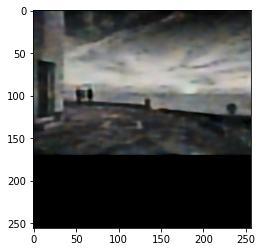

(256, 256, 3)


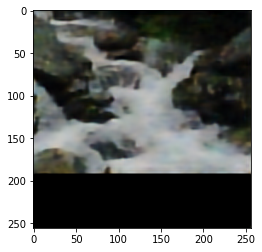

(256, 256, 3)


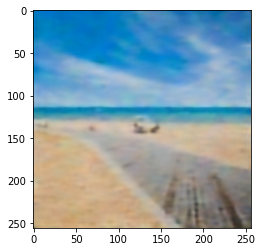

(256, 256, 3)


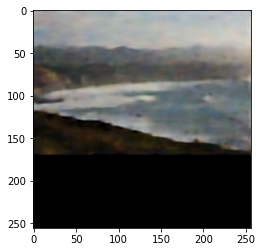

(256, 256, 3)


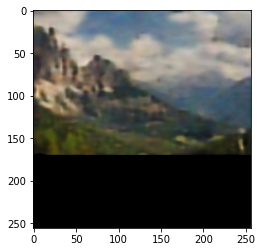

(256, 256, 3)


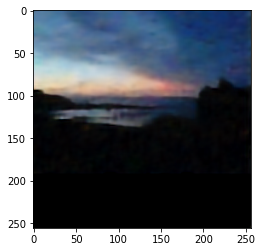

(256, 256, 3)


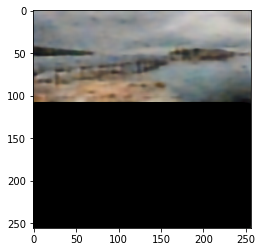

(256, 256, 3)


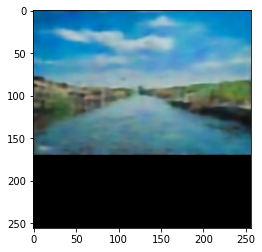

(256, 256, 3)


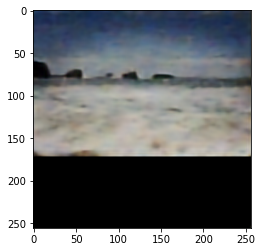

(256, 256, 3)


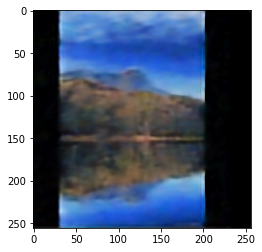

(256, 256, 3)


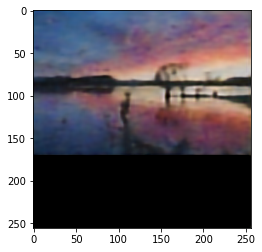

(256, 256, 3)


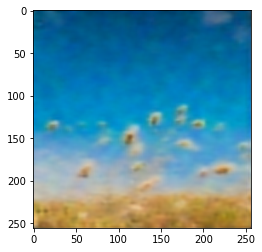

(256, 256, 3)


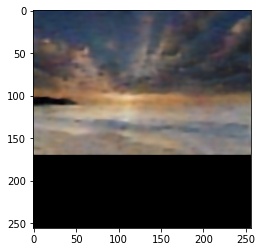

(256, 256, 3)


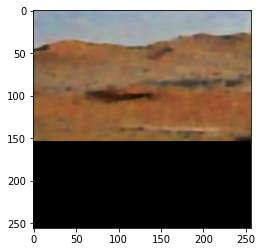

(256, 256, 3)


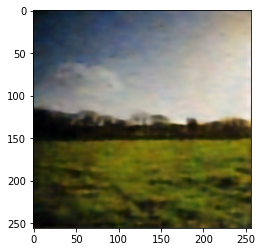

(256, 256, 3)


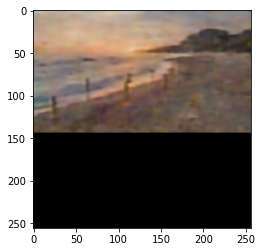

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


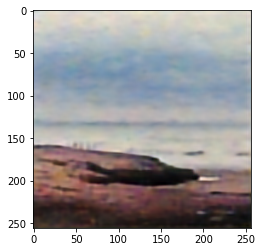

(256, 256, 3)


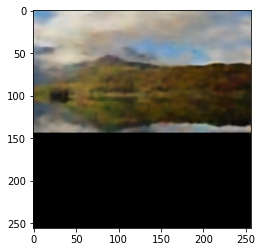

(256, 256, 3)


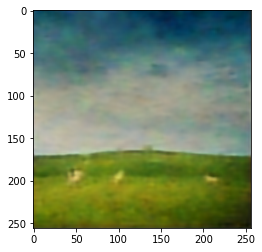

(256, 256, 3)


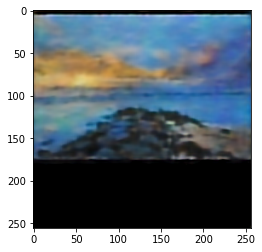

(256, 256, 3)


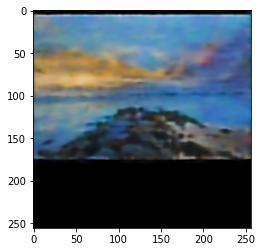

(256, 256, 3)


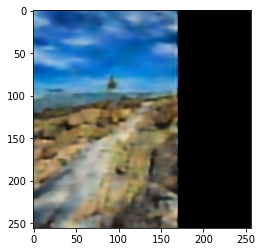

(256, 256, 3)


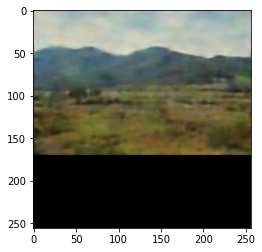

(256, 256, 3)


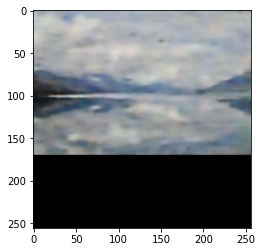

(256, 256, 3)


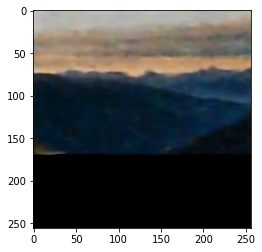

(256, 256, 3)


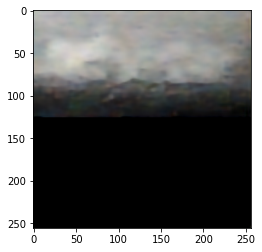

(256, 256, 3)


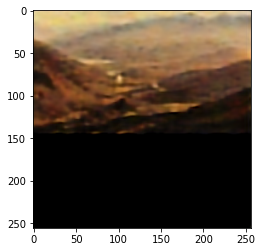

(256, 256, 3)


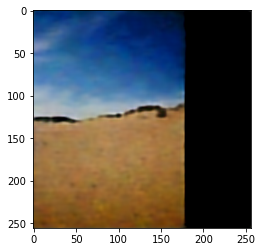

(256, 256, 3)


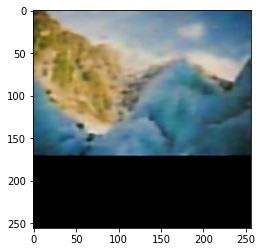

(256, 256, 3)


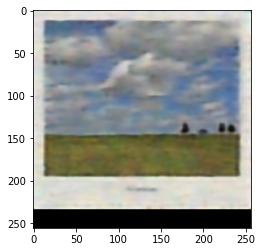

(256, 256, 3)


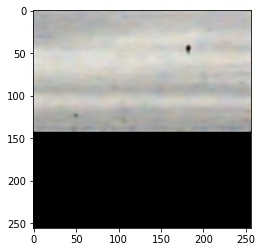

(256, 256, 3)


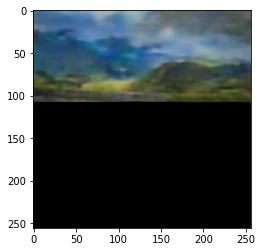

(256, 256, 3)


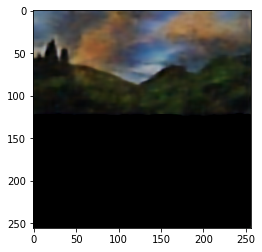

(256, 256, 3)


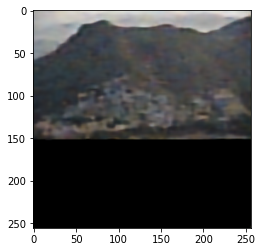

(256, 256, 3)


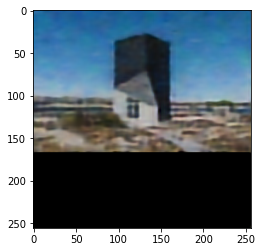

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


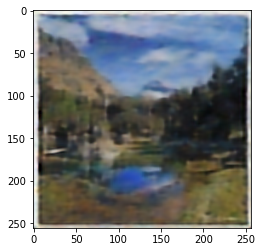

(256, 256, 3)


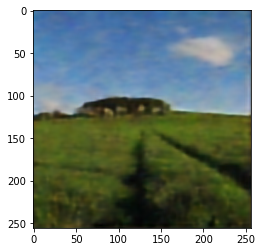

(256, 256, 3)


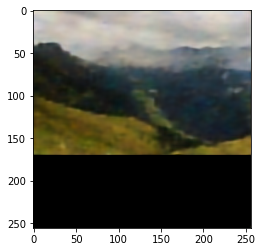

(256, 256, 3)


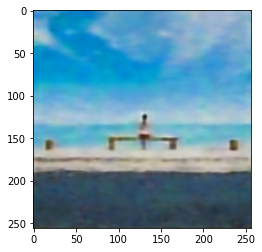

(256, 256, 3)


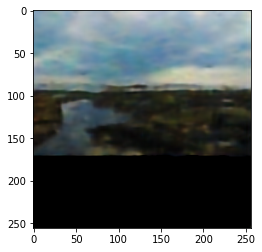

(256, 256, 3)


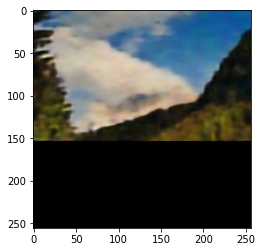

(256, 256, 3)


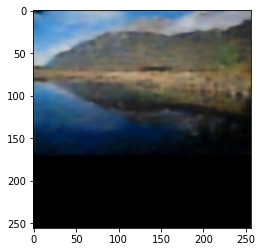

(256, 256, 3)


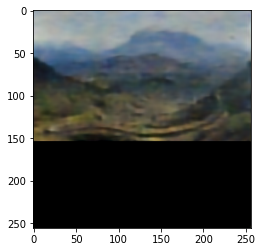

(256, 256, 3)


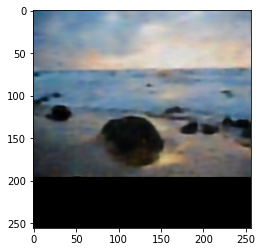

(256, 256, 3)


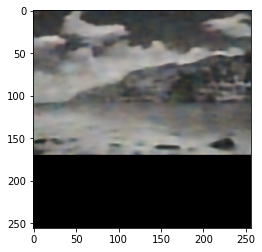

(256, 256, 3)


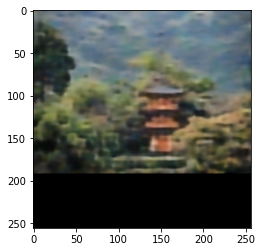

(256, 256, 3)


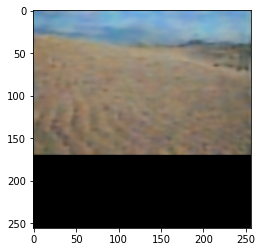

(256, 256, 3)


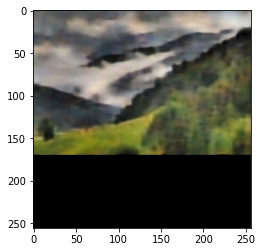

(256, 256, 3)


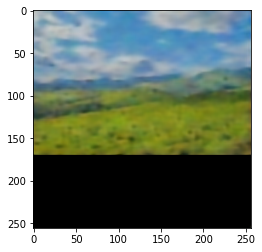

(256, 256, 3)


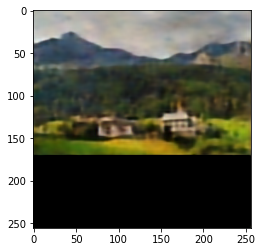

(256, 256, 3)


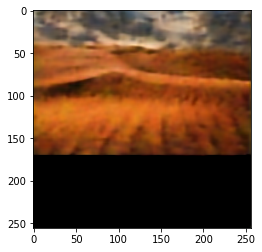

(256, 256, 3)


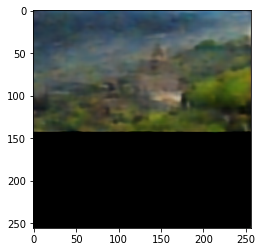

(256, 256, 3)


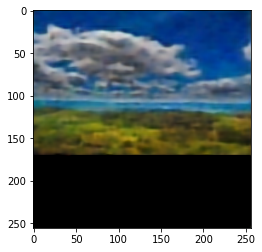

(256, 256, 3)


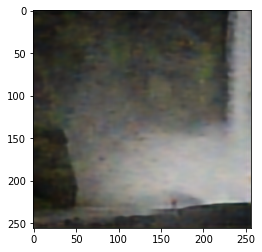

(256, 256, 3)


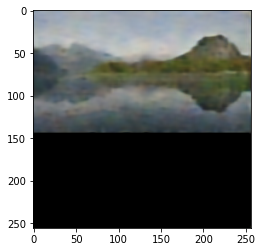

(256, 256, 3)


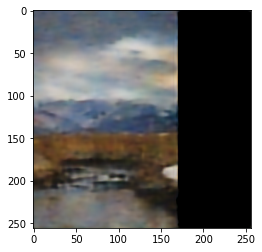

(256, 256, 3)


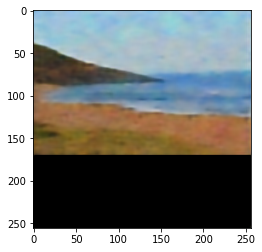

(256, 256, 3)


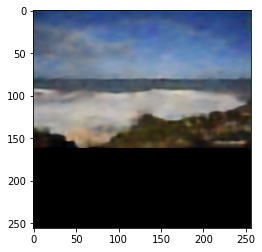

(256, 256, 3)


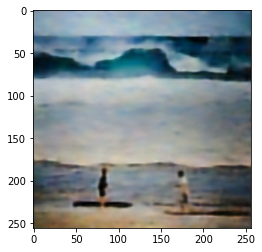

(256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


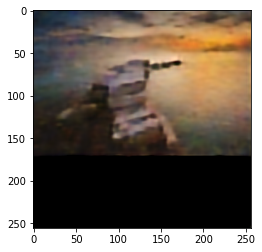

(256, 256, 3)


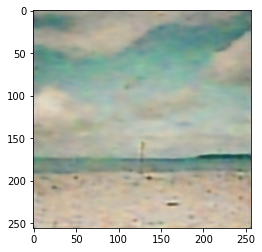

(256, 256, 3)


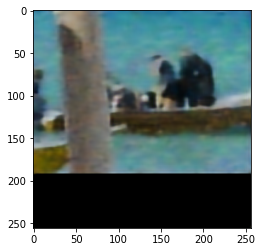

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


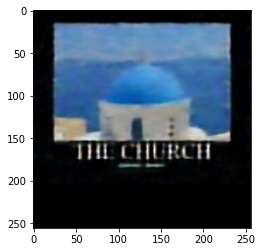

(256, 256, 3)


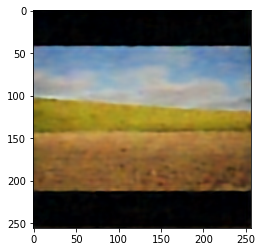

(256, 256, 3)


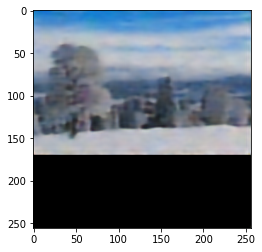

(256, 256, 3)


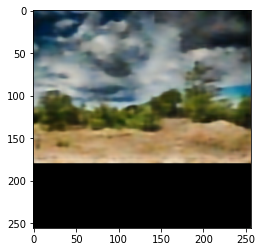

(256, 256, 3)


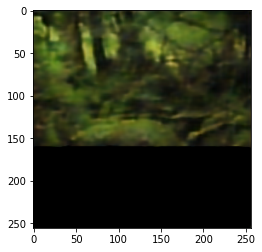

(256, 256, 3)


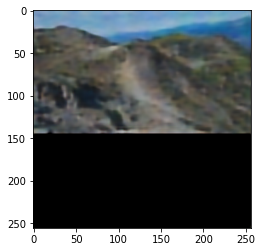

(256, 256, 3)


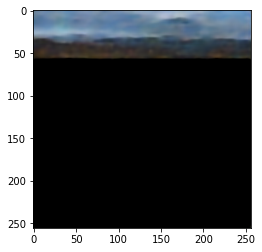

(256, 256, 3)


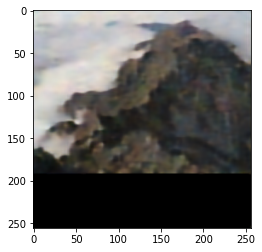

(256, 256, 3)


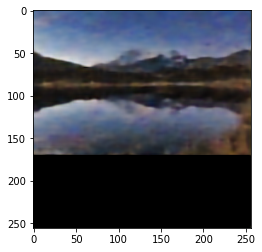

(256, 256, 3)


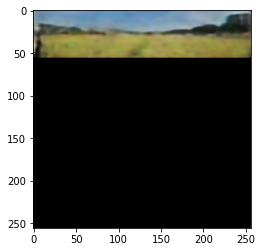

(256, 256, 3)


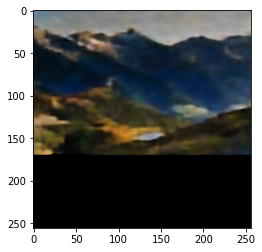

(256, 256, 3)


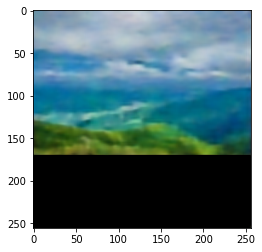

(256, 256, 3)


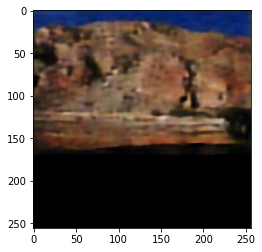

(256, 256, 3)


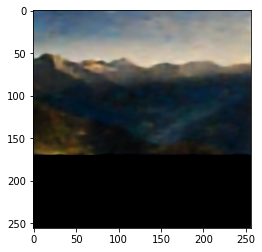

(256, 256, 3)


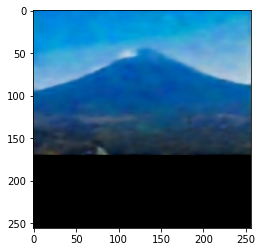

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


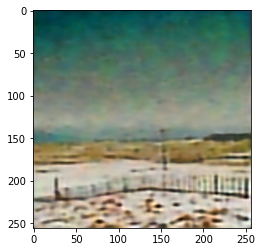

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


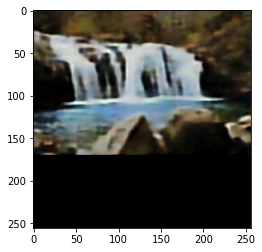

(256, 256, 3)


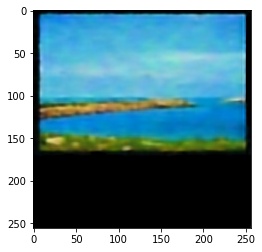

(256, 256, 3)


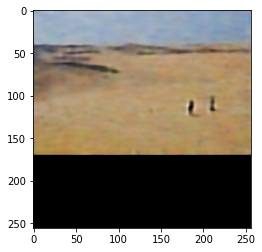

(256, 256, 3)


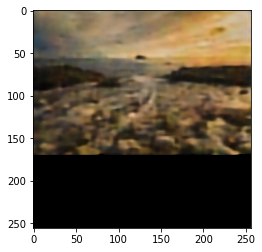

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)


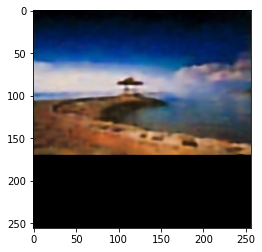

(256, 256, 3)


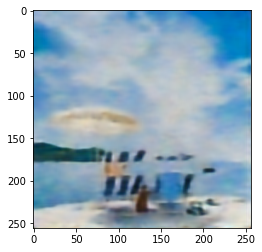

(256, 256, 3)


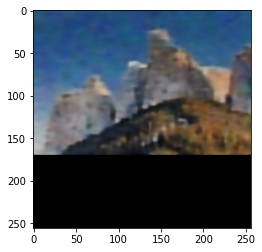

(256, 256, 3)


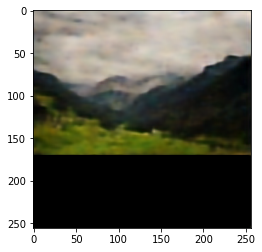

(256, 256, 3)


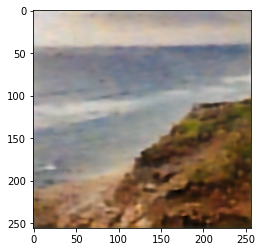

(256, 256, 3)


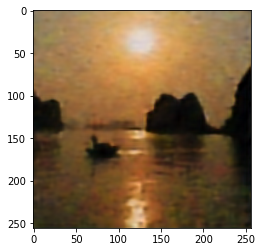

(256, 256, 3)


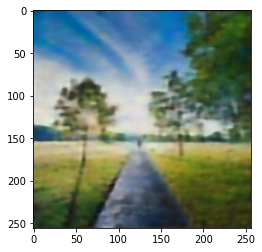

(256, 256, 3)


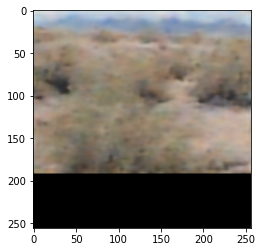

(256, 256, 3)


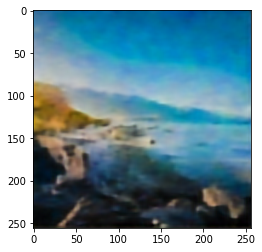

(256, 256, 3)


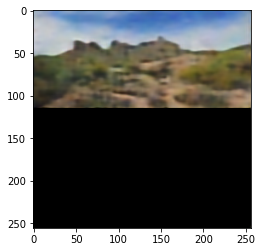

(256, 256, 3)


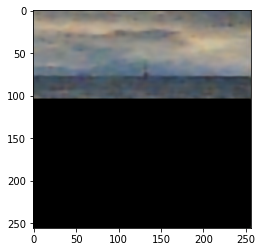

(256, 256, 3)


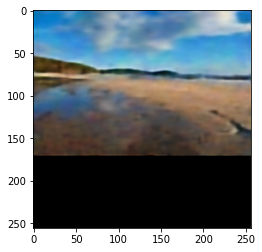

(256, 256, 3)


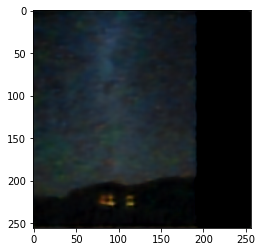

In [60]:
## FER2013 Denoising
for denoised in model.predict(x_test, batch_size=4):
    print(denoised.shape)
    #image = imutils.resize(image, width=width)
    #imutils.resize(denoised, width=int(width/3))
    plt.imshow(denoised)
    plt.show()

(256, 256, 3)


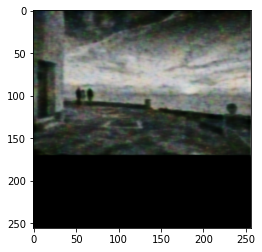

(256, 256, 3)


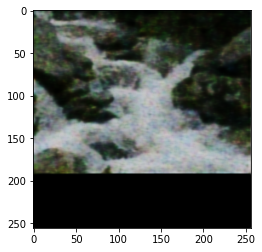

(256, 256, 3)


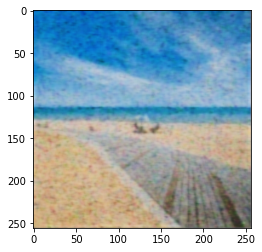

(256, 256, 3)


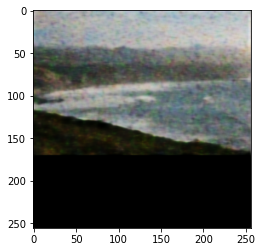

(256, 256, 3)


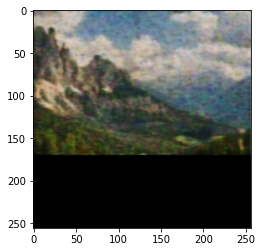

(256, 256, 3)


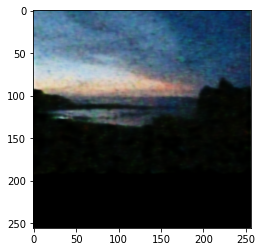

(256, 256, 3)


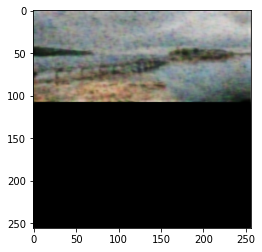

(256, 256, 3)


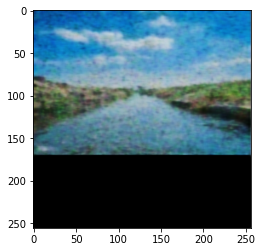

(256, 256, 3)


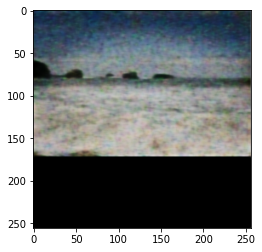

(256, 256, 3)


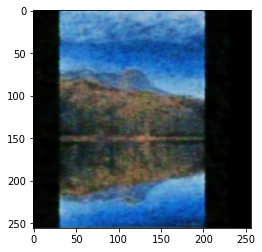

(256, 256, 3)


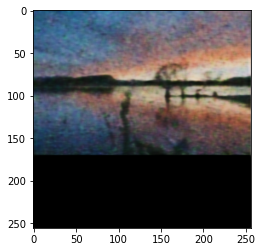

(256, 256, 3)


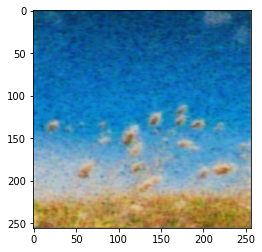

(256, 256, 3)


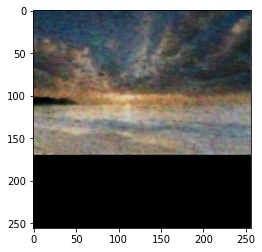

(256, 256, 3)


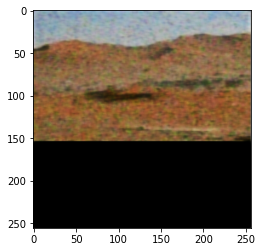

(256, 256, 3)


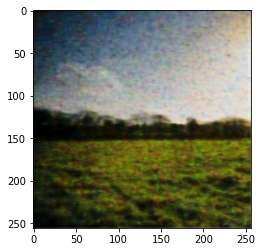

(256, 256, 3)


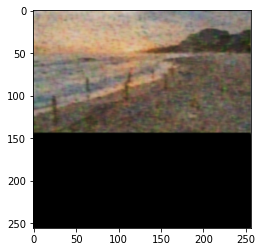

(256, 256, 3)


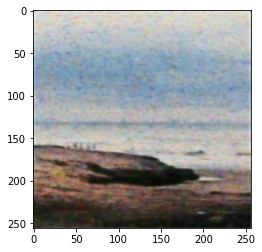

(256, 256, 3)


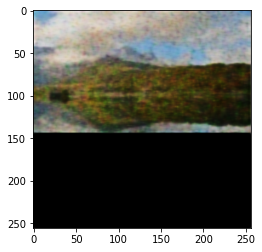

(256, 256, 3)


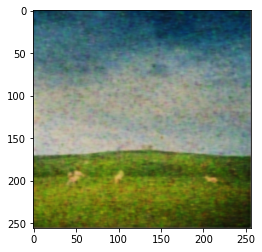

(256, 256, 3)


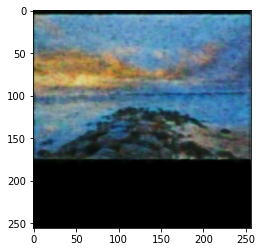

(256, 256, 3)


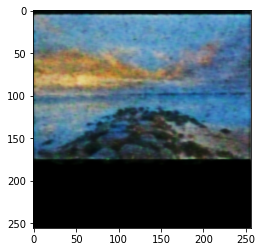

(256, 256, 3)


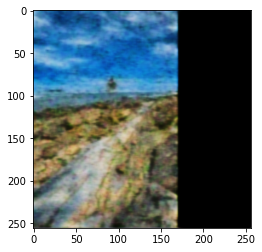

(256, 256, 3)


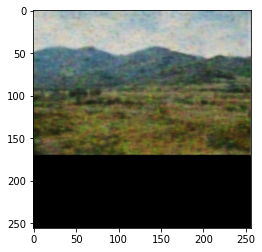

(256, 256, 3)


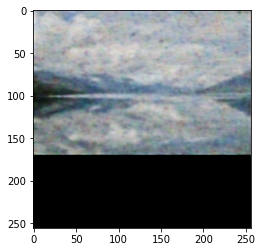

(256, 256, 3)


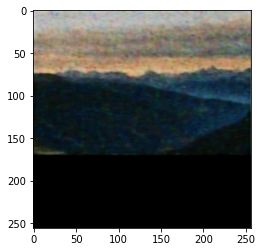

(256, 256, 3)


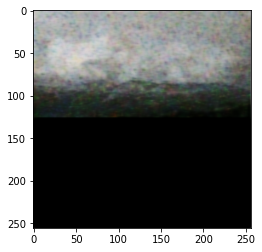

(256, 256, 3)


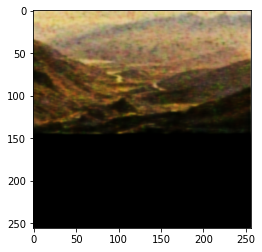

(256, 256, 3)


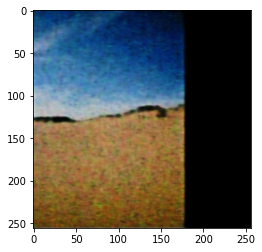

(256, 256, 3)


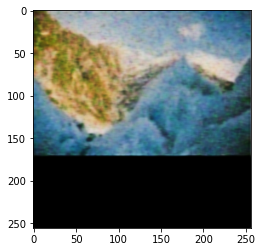

(256, 256, 3)


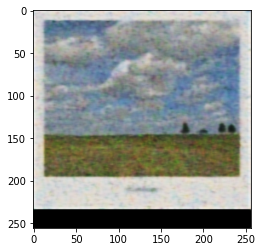

(256, 256, 3)


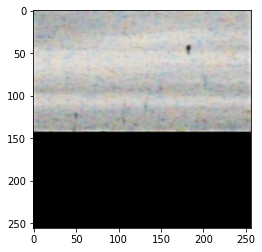

(256, 256, 3)


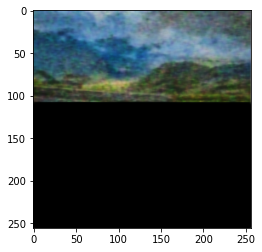

(256, 256, 3)


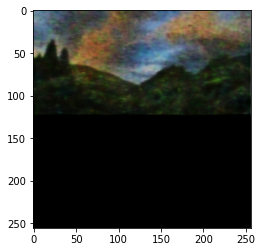

(256, 256, 3)


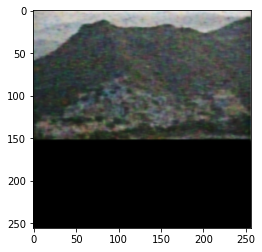

(256, 256, 3)


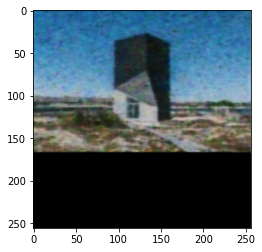

(256, 256, 3)


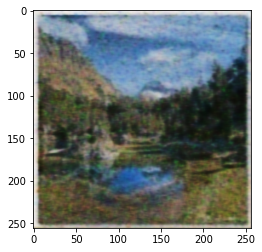

(256, 256, 3)


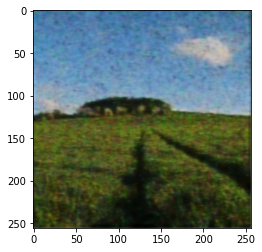

(256, 256, 3)


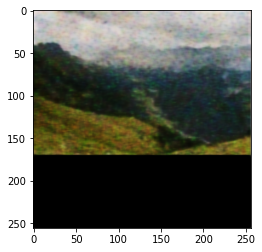

(256, 256, 3)


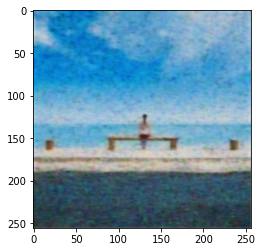

(256, 256, 3)


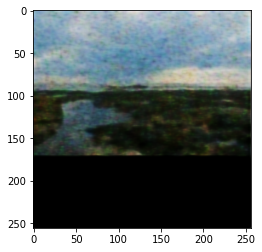

(256, 256, 3)


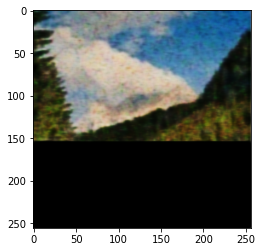

(256, 256, 3)


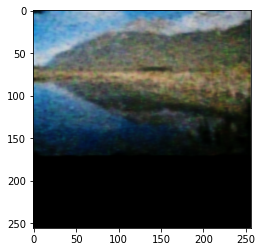

(256, 256, 3)


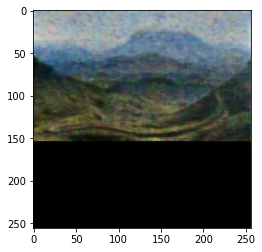

(256, 256, 3)


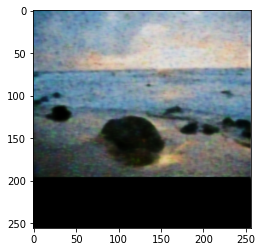

(256, 256, 3)


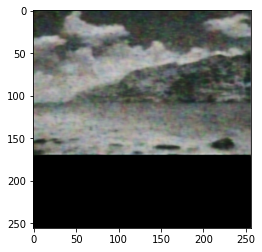

(256, 256, 3)


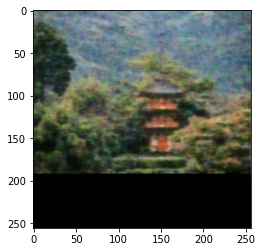

(256, 256, 3)


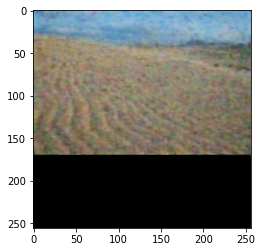

(256, 256, 3)


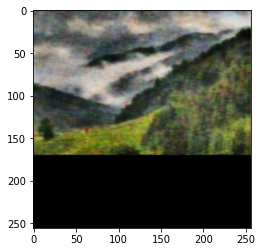

(256, 256, 3)


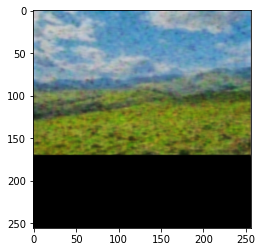

(256, 256, 3)


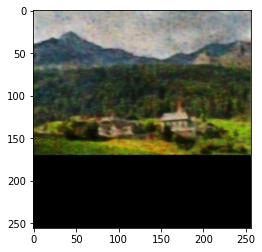

(256, 256, 3)


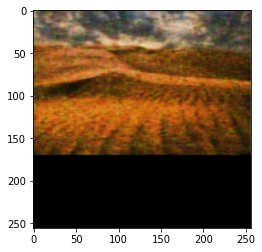

(256, 256, 3)


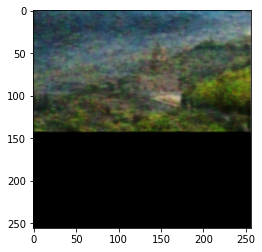

(256, 256, 3)


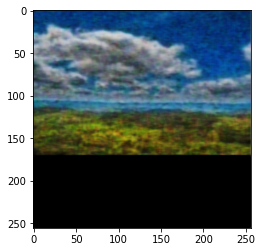

(256, 256, 3)


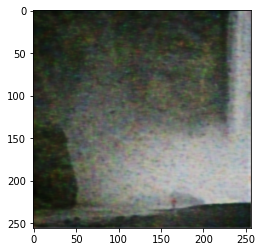

(256, 256, 3)


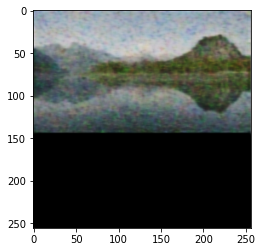

(256, 256, 3)


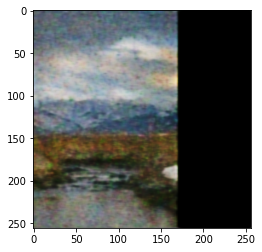

(256, 256, 3)


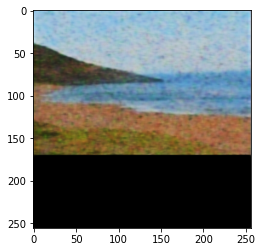

(256, 256, 3)


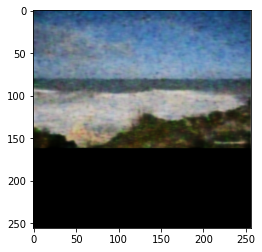

(256, 256, 3)


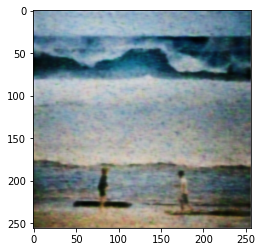

(256, 256, 3)


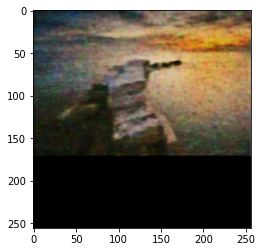

(256, 256, 3)


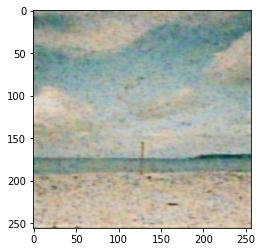

(256, 256, 3)


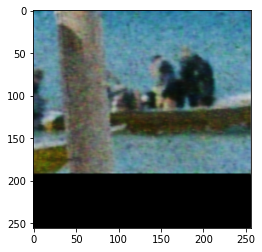

(256, 256, 3)


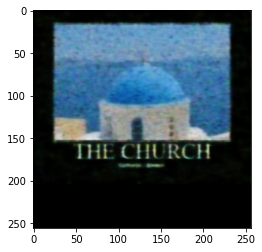

(256, 256, 3)


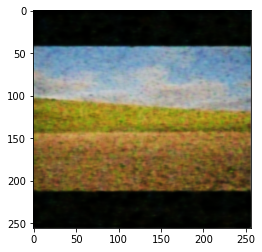

(256, 256, 3)


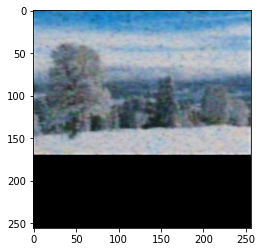

(256, 256, 3)


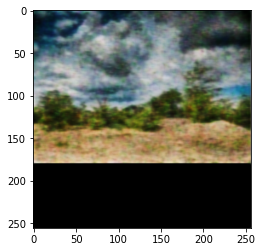

(256, 256, 3)


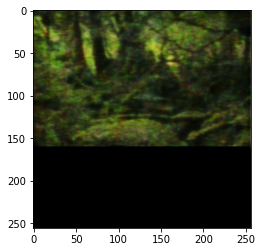

(256, 256, 3)


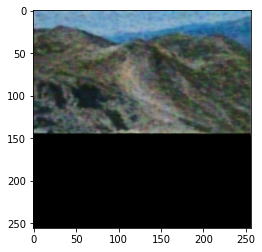

(256, 256, 3)


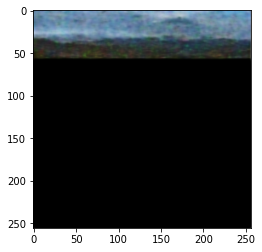

(256, 256, 3)


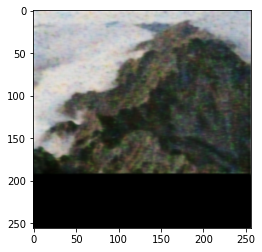

(256, 256, 3)


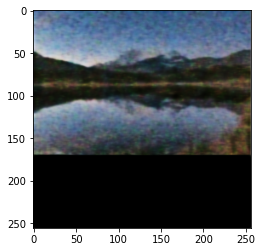

(256, 256, 3)


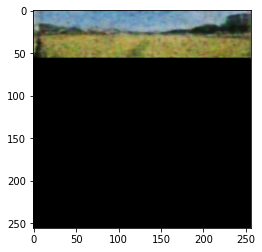

(256, 256, 3)


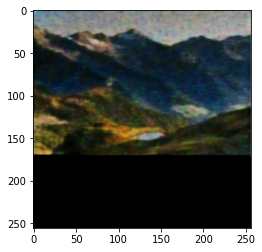

(256, 256, 3)


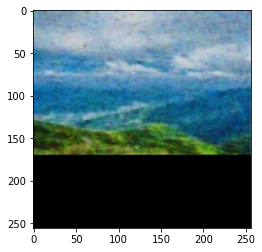

(256, 256, 3)


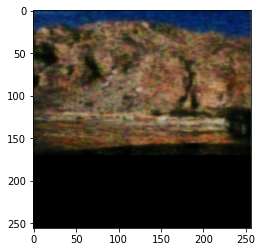

(256, 256, 3)


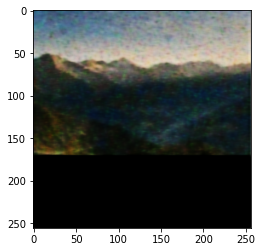

(256, 256, 3)


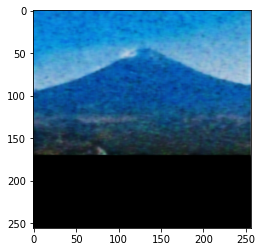

(256, 256, 3)


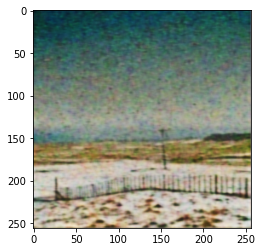

(256, 256, 3)


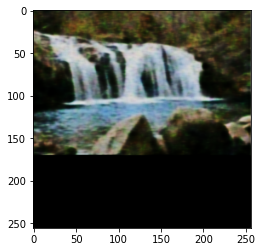

(256, 256, 3)


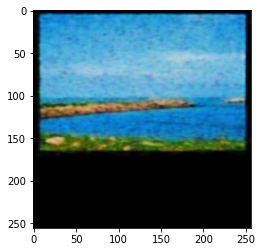

(256, 256, 3)


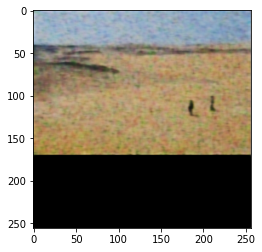

(256, 256, 3)


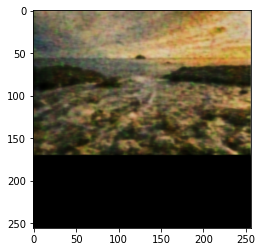

(256, 256, 3)


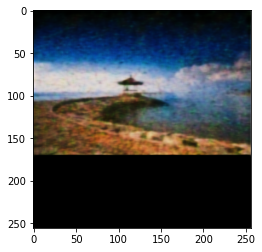

(256, 256, 3)


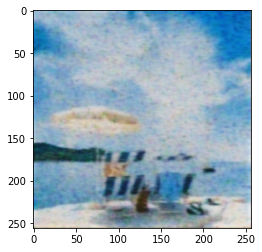

(256, 256, 3)


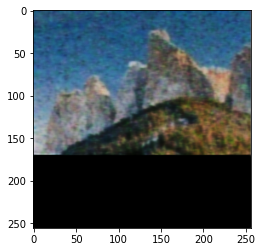

(256, 256, 3)


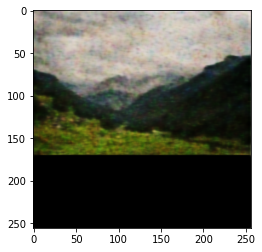

(256, 256, 3)


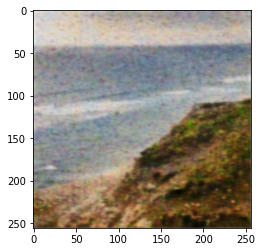

(256, 256, 3)


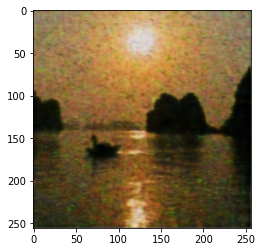

(256, 256, 3)


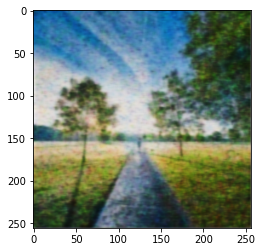

(256, 256, 3)


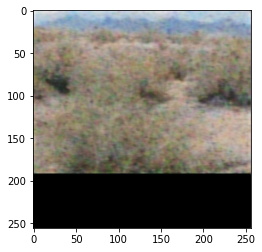

(256, 256, 3)


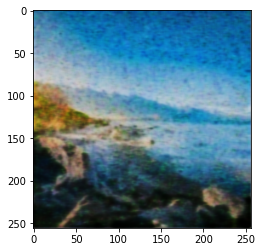

(256, 256, 3)


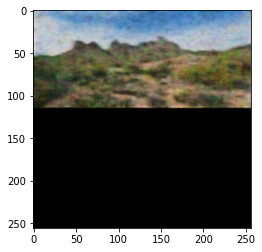

(256, 256, 3)


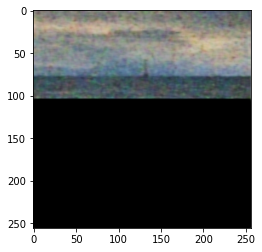

(256, 256, 3)


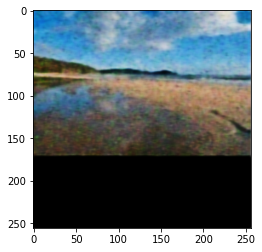

(256, 256, 3)


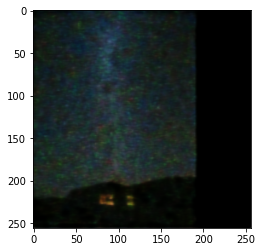

In [63]:
## U-Net
for denoised in model.predict(x_test, batch_size=4):
    print(denoised.shape)
    #image = imutils.resize(image, width=width)
    #imutils.resize(denoised, width=int(width/3))
    plt.imshow(denoised)
    plt.show()